In [1]:
import sys
import cv2
import numpy as np
sys.path.append('../')

In [2]:
from src.data_processing.io.image import Image

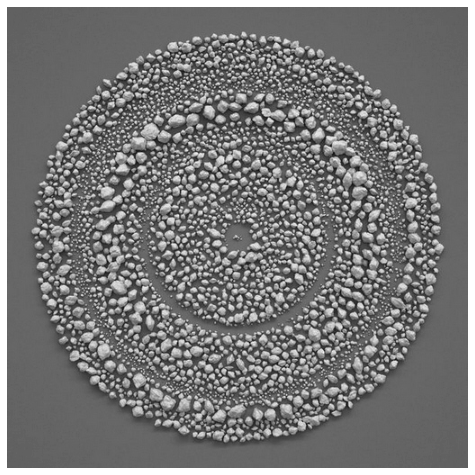

In [3]:
stones_image = Image.from_file("../data/stones.jpg")
stones_image.title = None
stones_image.plot()

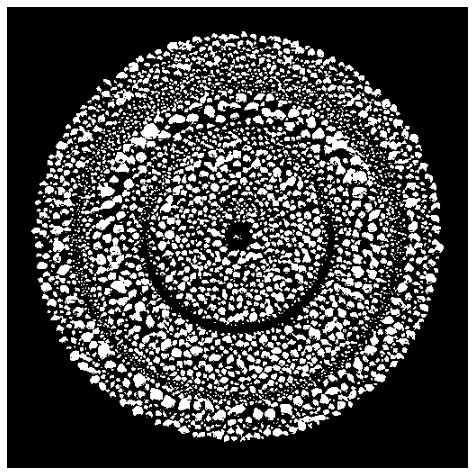

In [4]:
thresh = stones_image.threashold(127)
thresh.plot()

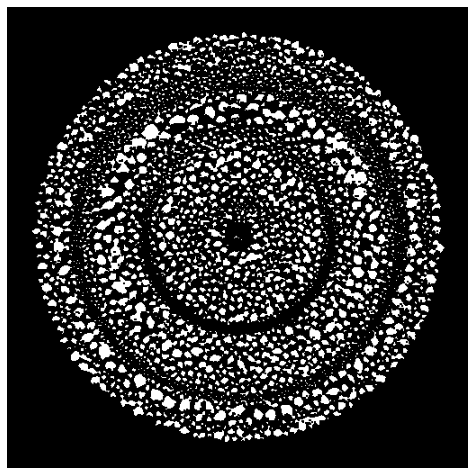

In [123]:
thresh.erode(kernel_size=2).plot()

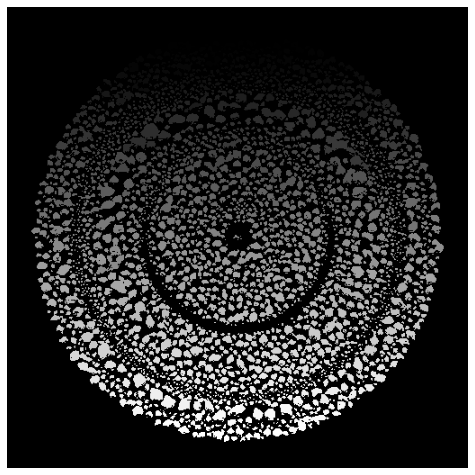

2259

In [21]:
ret, markers = cv2.connectedComponents(thresh.img)
Image(markers).plot()
len(np.unique(markers))

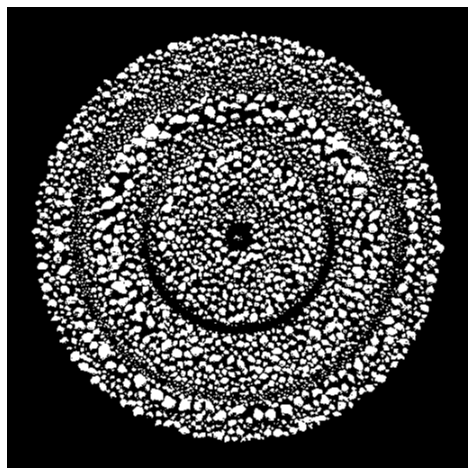

In [15]:
blurred = Image(cv2.blur(thresh.img, (2,2)))
blurred.plot()

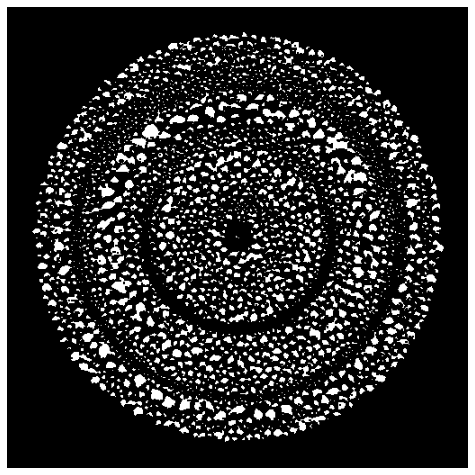

In [19]:
thresh2 = blurred.threashold(254)
thresh2.plot()

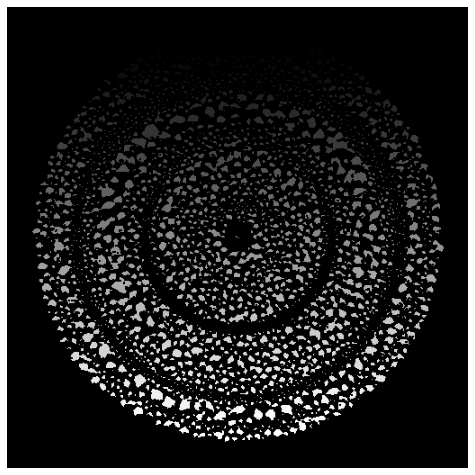

2344

In [20]:
ret, markers = cv2.connectedComponents(thresh2.img)
Image(markers).plot()
len(np.unique(markers))

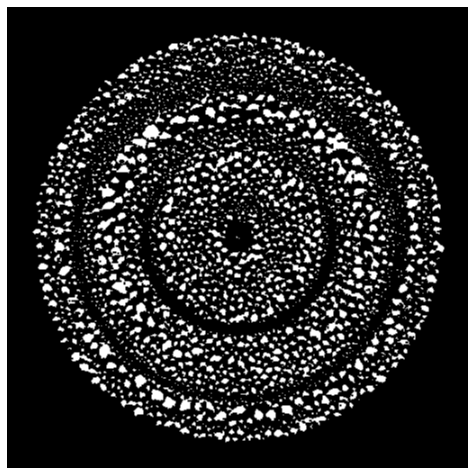

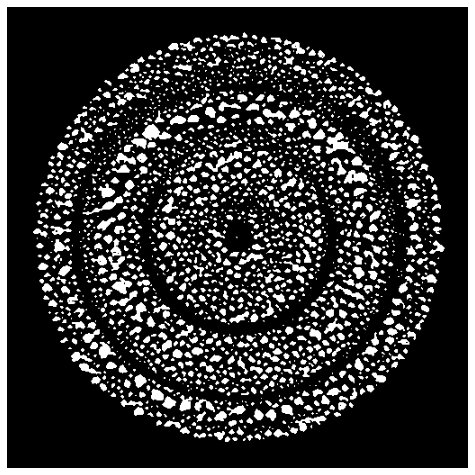

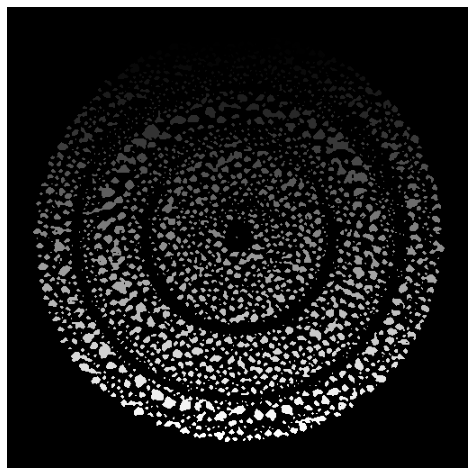

1916

In [28]:
blurred2 = Image(cv2.blur(thresh2.img, (2,2)))
blurred2.plot()
thresh3 = blurred2.threashold(100)
thresh3.plot()
ret, markers = cv2.connectedComponents(thresh3.img)
Image(markers).plot()
len(np.unique(markers))

# Прочий метод #1

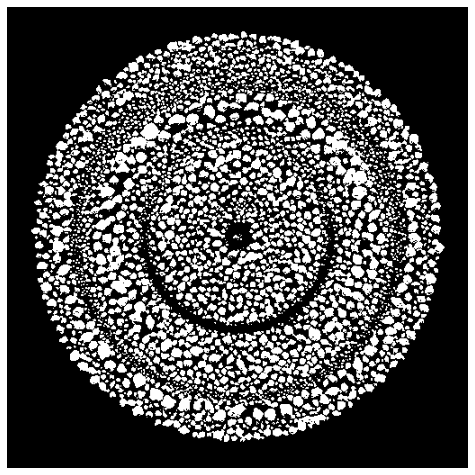

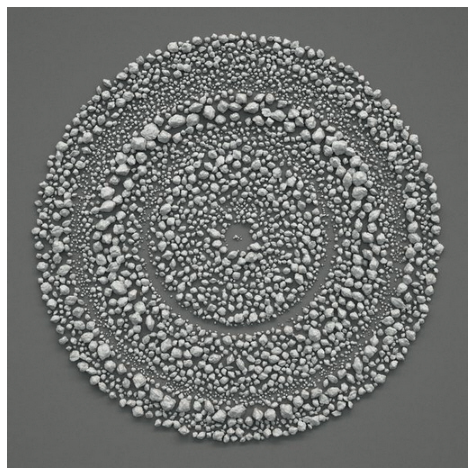

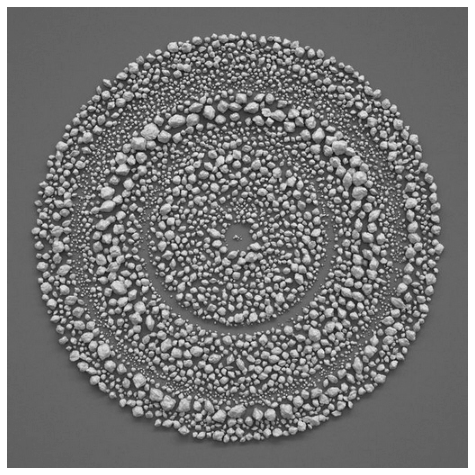

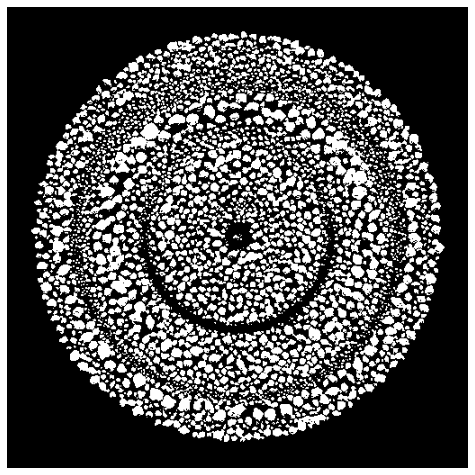

In [4]:
image = cv2.imread("../data/stones.jpg")
Image(image).plot()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
Image(gray).plot()
thresh = Image(gray).threashold(115)
thresh.plot()

In [7]:
from scipy import ndimage
from skimage.feature import peak_local_max
from skimage.morphology import watershed

In [8]:
D = ndimage.distance_transform_edt(thresh.img)
localMax = peak_local_max(D, indices=False, min_distance=3, labels=thresh.img)
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-D, markers, mask=thresh.img)
print("[INFO] {} unique segments found".format(len(np.unique(labels)) - 1))

c:\Users\Valenti\source\data-processing\venv\lib\site-packages\skimage\morphology\_deprecated.py:5: skimage_deprecation: Function ``watershed`` is deprecated and will be removed in version 0.19. Use ``skimage.segmentation.watershed`` instead.
  def watershed(image, markers=None, connectivity=1, offset=None, mask=None,
[INFO] 2748 unique segments found


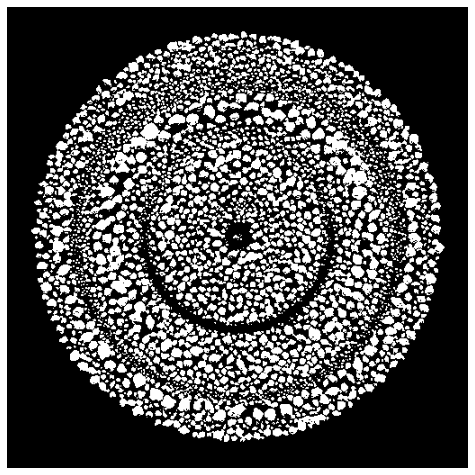

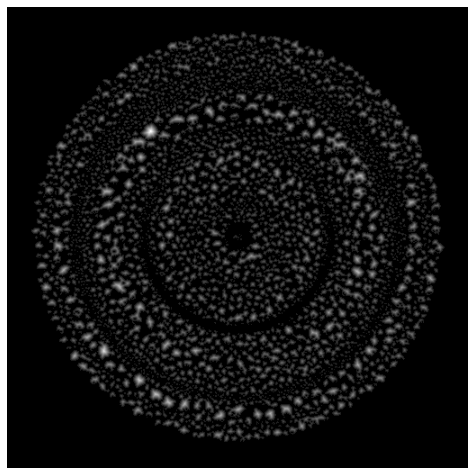

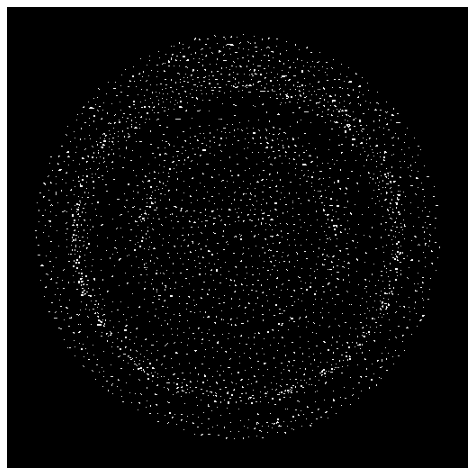

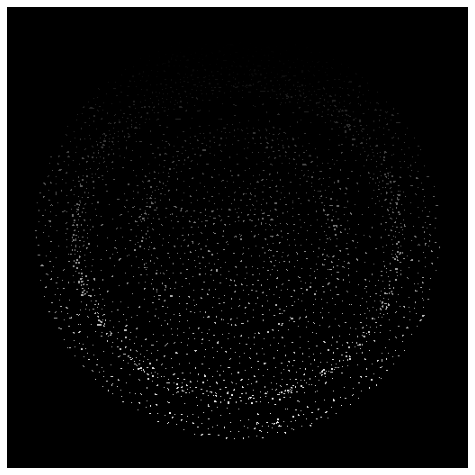

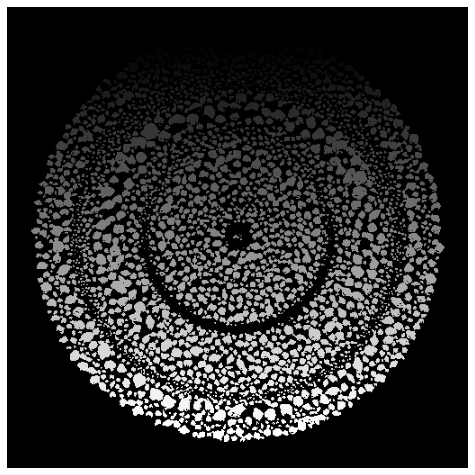

In [9]:
Image(thresh.img).plot()
Image(D).plot()
Image(localMax).plot()
Image(markers).plot()
Image(labels).plot()

In [10]:
def random_color():
    return (np.random.randint(1, 256), np.random.randint(1, 256), np.random.randint(1, 256))

In [11]:
color_map = {}
result = np.zeros((512,512,3), np.uint8)
for i in range(len(labels)):
    for j in range(len(labels[i])):
        if labels[i][j] == 0:
            continue
        elif labels[i][j] in color_map:
            result[i][j] = color_map[labels[i][j]]
        else:
            color_map[labels[i][j]] = random_color()
            result[i][j] = color_map[labels[i][j]]

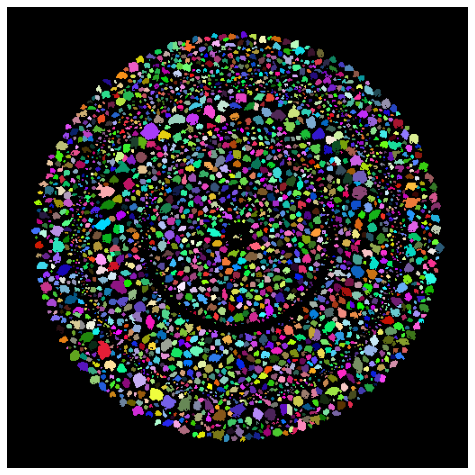

In [21]:
Image(result).plot()

In [13]:
from skimage.measure import regionprops

In [14]:
rp = regionprops(labels)
len(rp)

2748

In [17]:
results = {}
amounts = {}
for size in np.unique([int(np.round(prop.major_axis_length)) for prop in rp]):
    new_result = np.zeros_like(labels)
    amount = 0
    for prop in [prop for prop in rp if int(np.round(prop.major_axis_length)) == size]:
        amount += 1
        for x, y in prop.coords:
            new_result[x][y] = 1
    amounts[size] = amount
    results[size] = new_result

In [18]:
amounts[7]

296

In [126]:
my_labels = np.zeros_like(labels)
print(len([prop for prop in rp if int(np.round(prop.major_axis_length)) == 7]))
for prop in rp:
    size = np.round(prop.major_axis_length)
    if int(size) == 7:
        for x, y in prop.coords:
            my_labels[x][y] = 1

296


In [130]:
rp[0].bbox

(27, 260, 35, 267)

In [135]:
my_labels2 = np.zeros_like(labels)
print(len([prop for prop in rp if max(prop.bbox[2] - prop.bbox[0], prop.bbox[3] - prop.bbox[1]) == 7]))
for prop in rp:
    box = prop.bbox
    size = max(box[2] - box[0], box[3] - box[1])
    if int(size) == 7:
        for x, y in prop.coords:
            my_labels2[x][y] = 1

282


In [149]:
my_labels3 = np.zeros_like(labels)
print(len([prop for prop in rp if min(prop.bbox[2] - prop.bbox[0], prop.bbox[3] - prop.bbox[1]) == 7]))
for prop in rp:
    box = prop.bbox
    size = min(box[2] - box[0], box[3] - box[1])
    if int(size) == 7:
        for x, y in prop.coords:
            my_labels3[x][y] = 1

236


In [24]:
new_labels = np.zeros_like(labels)
for prop in rp:
    size = np.round(prop.major_axis_length)
    for x, y in prop.coords:
        new_labels[x][y] = int(size)

In [141]:
new_labels2 = np.zeros_like(labels)
for prop in rp:
    box = prop.bbox
    size = max(box[2] - box[0], box[3] - box[1])
    for x, y in prop.coords:
        new_labels2[x][y] = int(size)

In [142]:
new_labels3 = np.zeros_like(labels)
for prop in rp:
    box = prop.bbox
    size = min(box[2] - box[0], box[3] - box[1])
    for x, y in prop.coords:
        new_labels3[x][y] = int(size)

In [121]:
np.unique(new_labels)

array([ 0,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21])

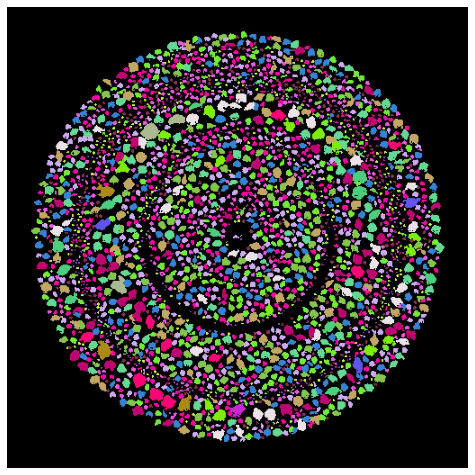

In [120]:
color_map = {}
result = np.zeros((512,512,3), np.uint8)
for i in range(len(new_labels)):
    for j in range(len(new_labels[i])):
        if new_labels[i][j] == 0:
            continue
        elif new_labels[i][j] in color_map:
            result[i][j] = color_map[new_labels[i][j]]
        else:
            color_map[new_labels[i][j]] = random_color()
            result[i][j] = color_map[new_labels[i][j]]
Image(result).plot()

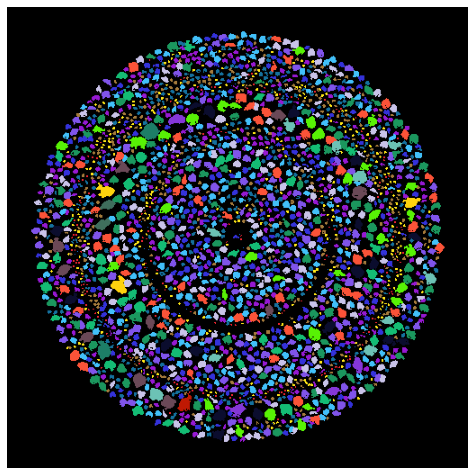

In [143]:
color_map = {}
result = np.zeros((512,512,3), np.uint8)
for i in range(len(new_labels2)):
    for j in range(len(new_labels2[i])):
        if new_labels2[i][j] == 0:
            continue
        elif new_labels2[i][j] in color_map:
            result[i][j] = color_map[new_labels2[i][j]]
        else:
            color_map[new_labels2[i][j]] = random_color()
            result[i][j] = color_map[new_labels2[i][j]]
Image(result).plot()

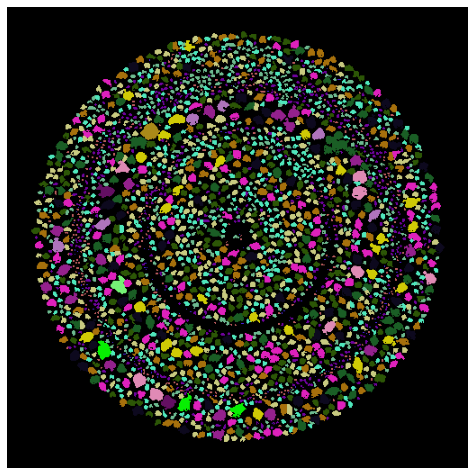

In [144]:
color_map = {}
result = np.zeros((512,512,3), np.uint8)
for i in range(len(new_labels3)):
    for j in range(len(new_labels3[i])):
        if new_labels3[i][j] == 0:
            continue
        elif new_labels3[i][j] in color_map:
            result[i][j] = color_map[new_labels3[i][j]]
        else:
            color_map[new_labels3[i][j]] = random_color()
            result[i][j] = color_map[new_labels3[i][j]]
Image(result).plot()

In [40]:
import imutils

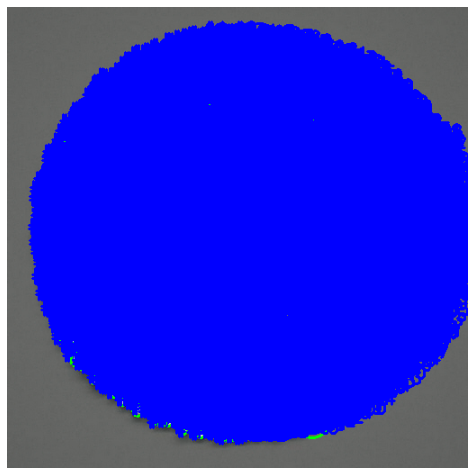

In [52]:
for label in np.unique(labels):
	# if the label is zero, we are examining the 'background'
	# so simply ignore it
	if label == 0:
		continue
	# otherwise, allocate memory for the label region and draw
	# it on the mask
	mask = np.zeros(gray.shape, dtype="uint8")
	mask[labels == label] = 255
	# detect contours in the mask and grab the largest one
	cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,
		cv2.CHAIN_APPROX_SIMPLE)
	cnts = imutils.grab_contours(cnts)
	c = max(cnts, key=cv2.contourArea)
	# draw a circle enclosing the object
	((x, y), r) = cv2.minEnclosingCircle(c)
	cv2.circle(image, (int(x), int(y)), int(r), (0, 255, 0), 2)
	cv2.putText(image, "#{}".format(label), (int(x) - 10, int(y)),
		cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
# show the output image
Image(image).plot()

# Прочие методы

In [25]:
label_hue = np.uint8(179*new_labels/np.max(new_labels))
len(label_hue)

512

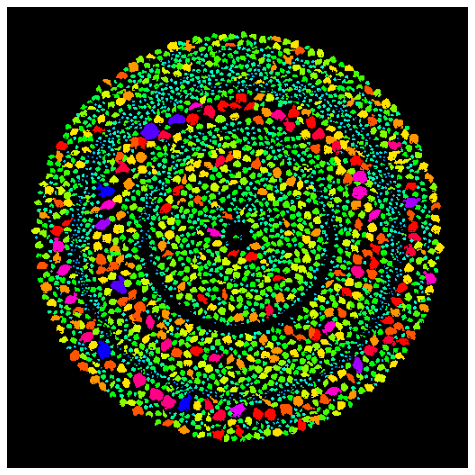

In [27]:
label_hue = np.uint8(179*new_labels/np.max(new_labels))
blank_ch = 255*np.ones_like(label_hue)
labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

# cvt to BGR for display
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

# set bg label to black
labeled_img[label_hue==0] = 0

Image(labeled_img).plot()

In [ ]:
results

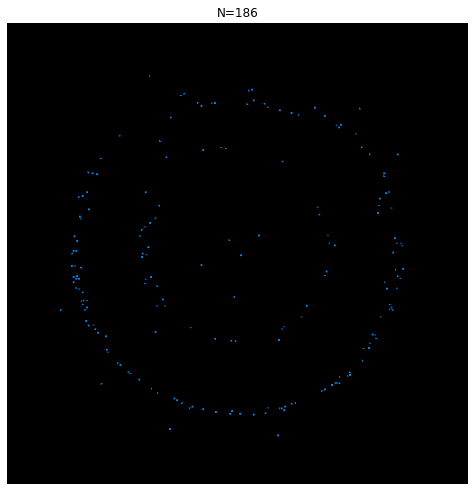

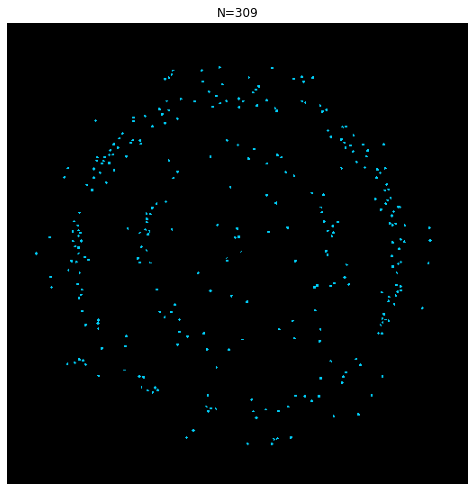

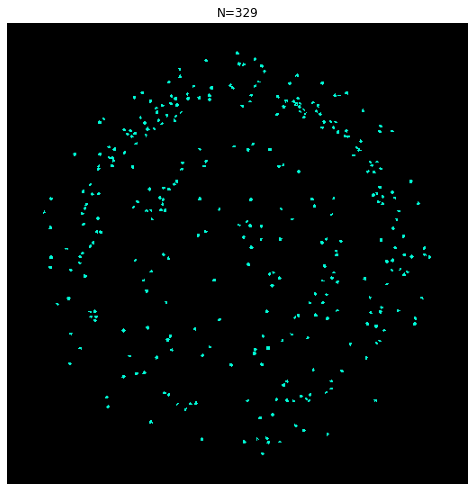

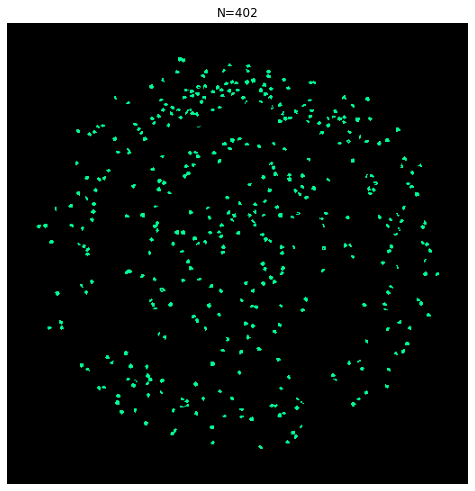

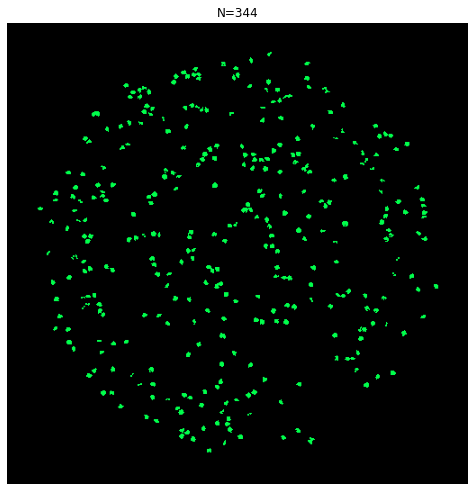

...

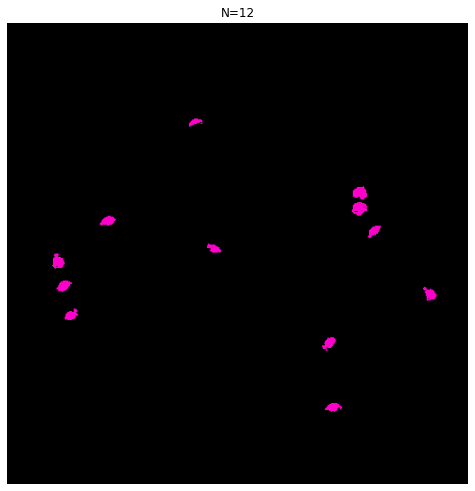

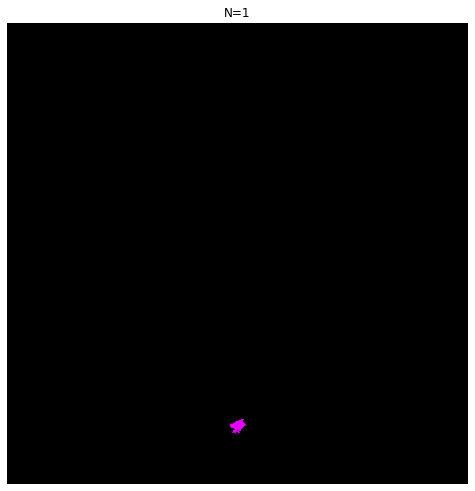

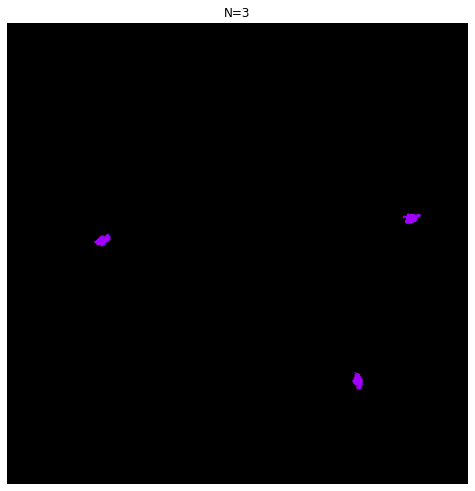

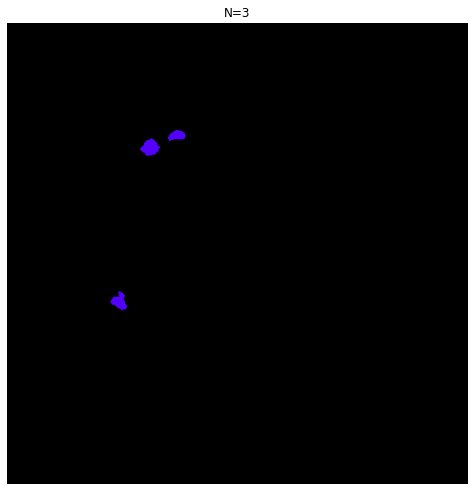

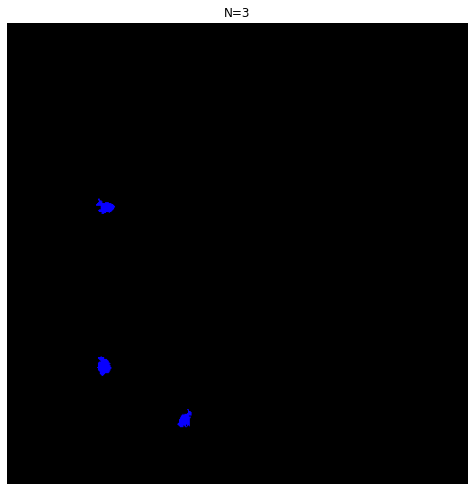

In [31]:
for size, mask in results.items():
    if size != 0:
        masked_image = labeled_img.copy()
        for i in range(len(mask)):
            for j in range(len(mask[i])):
                if mask[i][j] == 0:
                    masked_image[i][j] = (0, 0, 0)
        Image(masked_image, title=f"Size={size}, N={amounts[size]}").plot()

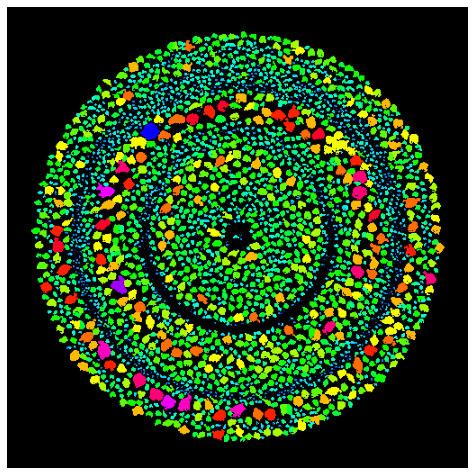

In [146]:
label_hue = np.uint8(179*new_labels3/np.max(new_labels3))
blank_ch = 255*np.ones_like(label_hue)
labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

# cvt to BGR for display
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

# set bg label to black
labeled_img[label_hue==0] = 0

Image(labeled_img).plot()

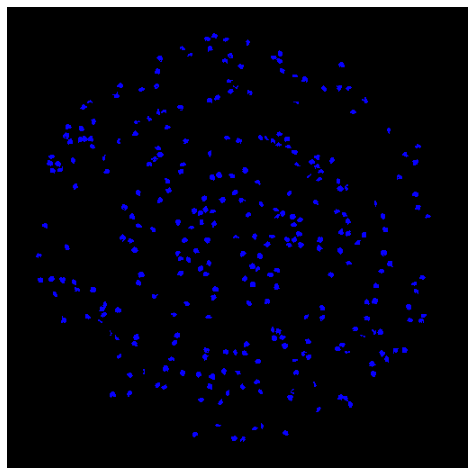

In [127]:
label_hue = np.uint8(179*my_labels/np.max(my_labels))
blank_ch = 255*np.ones_like(label_hue)
labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

# cvt to BGR for display
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

# set bg label to black
labeled_img[label_hue==0] = 0

Image(labeled_img).plot()

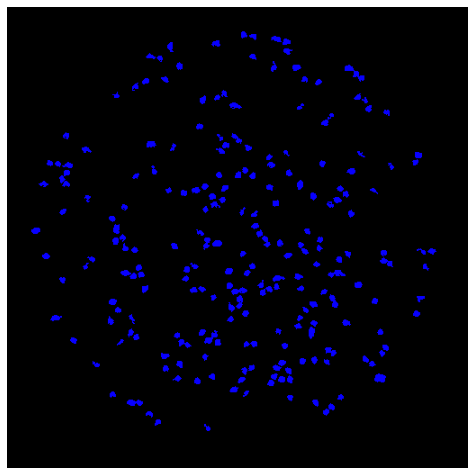

In [150]:
label_hue = np.uint8(179*my_labels3/np.max(my_labels3))
blank_ch = 255*np.ones_like(label_hue)
labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

# cvt to BGR for display
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

# set bg label to black
labeled_img[label_hue==0] = 0

Image(labeled_img).plot()

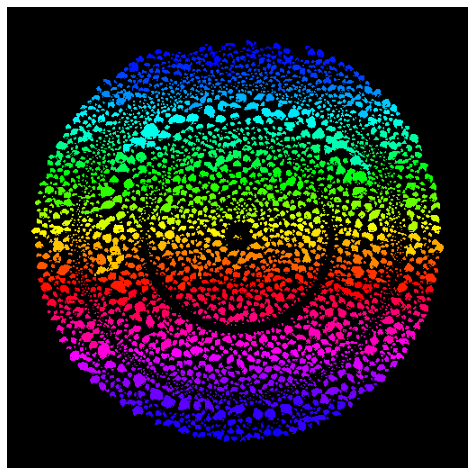

In [55]:
import cv2
import numpy as np

img = cv2.imread('../data/stones.jpg', 0)
img = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)[1]  # ensure binary
ret, labels = cv2.connectedComponents(img)

# Map component labels to hue val
label_hue = np.uint8(179*labels/np.max(labels))
blank_ch = 255*np.ones_like(label_hue)
labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])

# cvt to BGR for display
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)

# set bg label to black
labeled_img[label_hue==0] = 0

Image(labeled_img).plot()

In [61]:
len(np.unique(labels))

2259

In [66]:
img

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

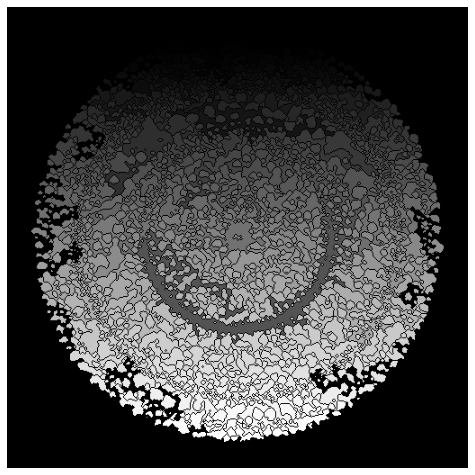

In [68]:
markers = cv2.watershed(cv2.cvtColor(img, cv2.COLOR_GRAY2BGR), labels)
Image(markers).plot()

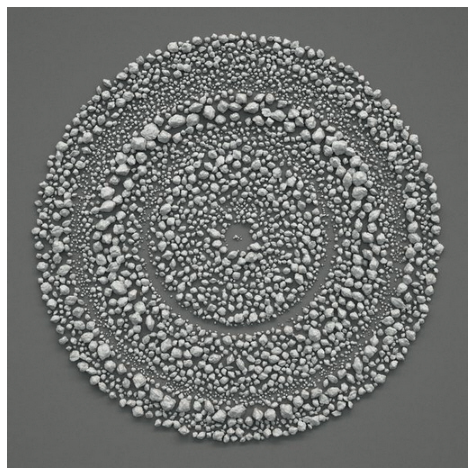

In [72]:
image = cv2.imread("../data/stones.jpg")
shifted = cv2.pyrMeanShiftFiltering(image, 21, 51)

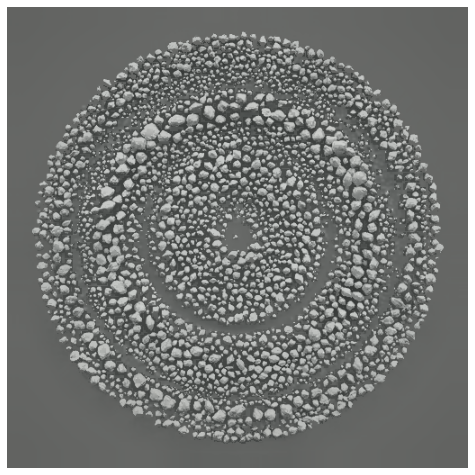

In [73]:
Image(shifted).plot()

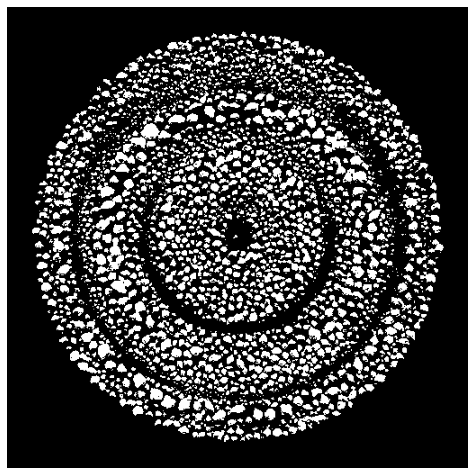

In [74]:
gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
Image(thresh).plot()

In [77]:
import imutils

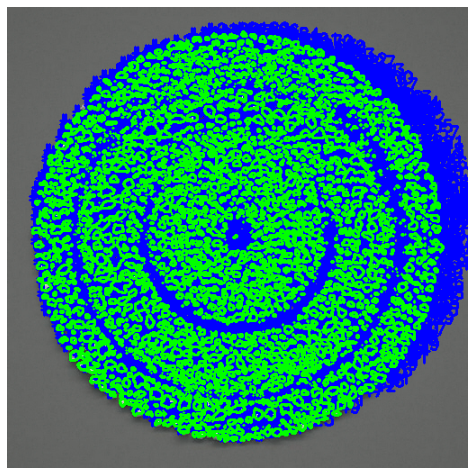

In [79]:
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

for (i, c) in enumerate(cnts):
	((x, y), _) = cv2.minEnclosingCircle(c)
	# cv2.putText(image, "#{}".format(i + 1), (int(x) - 10, int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
	cv2.drawContours(image, [c], -1, (0, 255, 0), 2)

Image(image).plot()